# Установка библиотек

In [148]:
!pip install ultralytics --quiet
!pip install supervision --quiet

# Импорт библиотек

In [149]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from IPython.display import HTML, clear_output
from tqdm.notebook import tqdm
from base64 import b64encode

from ultralytics import YOLO

from supervision import VideoInfo, VideoSink
from supervision import get_video_frames_generator
from supervision import Detections, TraceAnnotator
from supervision import ByteTrack
from supervision import annotators

# Импорт видео

In [150]:
!gdown 1pQ9VpZKTttj_wwzyCs5shmXJ_70lrCIB

Downloading...
From: https://drive.google.com/uc?id=1pQ9VpZKTttj_wwzyCs5shmXJ_70lrCIB
To: /content/people.MP4
100% 4.41M/4.41M [00:00<00:00, 239MB/s]


# Константы

In [151]:
VIDEO_PATH = "people.MP4"
VIDEO_PATH_NEW = "people_new.MP4"

# Вспомогательные функции

In [152]:
def show_video(path: str):
    # Удаляем суффикс ".mp4" из пути к файлу и добавляем суффикс "_compressed.mp4" для получения пути к сжатому файлу
    path_compressed = path.removesuffix(".mp4") + "_compressed.mp4"

    # Используем библиотеку ffmpeg для сжатия видеофайла с помощью кодека H.264
    os.system(f"ffmpeg -i {path} -vcodec libx264 {path_compressed}")

    # Открываем сжатый файл видео для чтения в двоичном режиме и сохраняем его содержимое в переменной mp4
    with open(path_compressed, "rb") as video:
        mp4 = video.read()

    # Удаляем сжатый файл видео из системы
    os.remove(path_compressed)

    # Кодируем содержимое файла видео в base64 и сохраняем результат в переменной data_url
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    # Генерируем HTML-код для отображения видео с помощью тегов <video> и <source>
    # Путь к видеофайлу указывается в атрибуте src в формате "data:video/mp4;base64,{кодированное_содержимое_файла}"
    html = f"""
    <video width=800 controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """

    # Возвращаем HTML-код для отображения видео
    return HTML(html)

# Тестирование функционала

## Видео:

Для работы с видео существует 2 основных класса:
- VideoInfo - класс описания видео
- VideoSink - класс для записи видео

и функция для чтения, возвращающая генератор:
- get_video_frames_generator - возвращает генератор, где каждая итерация возвращает кадр из видео

([Документация](https://supervision.roboflow.com/latest/utils/video/))

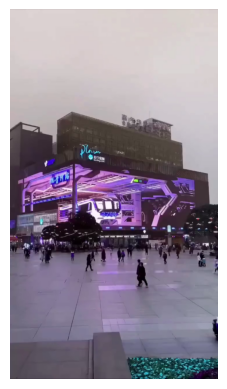

In [153]:
gen = get_video_frames_generator(VIDEO_PATH)

for i, frame in enumerate(gen):
    if i > 5: break
    plt.imshow(frame)
    plt.axis("off")
    plt.show()
    clear_output(True)

In [154]:
gen = get_video_frames_generator(VIDEO_PATH)
video_info = VideoInfo.from_video_path(VIDEO_PATH)
video_writer = VideoSink(VIDEO_PATH_NEW, video_info)

with video_writer as sink:
    for i, frame in enumerate(gen):
        if i > 100: break
        frame[400:500, 300:400] = np.array([255, 0, 0])
        frame[200:300, 300:400] = np.array([0, 255, 0])
        frame[600:700, 300:400] = np.array([0, 0, 255])
        sink.write_frame(frame)

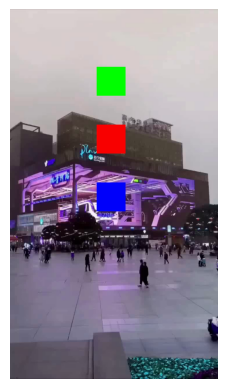

In [155]:
gen = get_video_frames_generator(VIDEO_PATH_NEW)

plt.imshow(next(gen))
plt.axis("off")
plt.show()

## Детекция

Для работы с результатами детекции существует класс Detections.
Он имеет множество методов для преобразования детекций разных моделей:
- from_sam
- from_ultralytics
- from_yolo_nas

... и их ещё много. Теперь можно легко менять детекторы.

([Документация](https://supervision.roboflow.com/latest/detection/core/))

In [156]:
detector = YOLO("yolov8n.pt")
gen = get_video_frames_generator(VIDEO_PATH)
frame = next(gen)

yolo_detections = detector(frame)[0]
supervision_detections = Detections.from_ultralytics(yolo_detections)


0: 640x384 6 persons, 1 car, 13.2ms
Speed: 2.0ms preprocess, 13.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


In [157]:
supervision_detections

Detections(xyxy=array([[     445.85,      868.55,      481.38,      965.72],
       [     257.65,      844.95,      280.84,      907.43],
       [     370.42,      826.78,      391.42,      875.71],
       [      46.95,      807.33,      70.149,      867.71],
       [      309.7,      806.15,      329.61,       874.7],
       [     576.15,      813.71,      597.44,      865.46],
       [     682.39,        1067,         720,      1149.3]], dtype=float32), mask=None, confidence=array([    0.63493,     0.61212,     0.36867,     0.35466,     0.33351,     0.29947,     0.25957], dtype=float32), class_id=array([0, 0, 0, 0, 0, 0, 2]), tracker_id=None, data={'class_name': array(['person', 'person', 'person', 'person', 'person', 'person', 'car'], dtype='<U6')})

## Трекинг

Пока что библиотека не может похвастаться большим количеством реализаций трекеров. На данный момент доступен только ByteTrack.

Но в целом, это не сильно усложняет задачу. Сейчас, выбрав любой из доступных трекеров, нам достаточно получить предикт и записать его в поле tracker_id класса Detections.

([Документация](https://supervision.roboflow.com/latest/trackers/))

На данном этапе, в это поле ничего не вписано:

In [158]:
print(supervision_detections.tracker_id)

None


Но после предикта трекером они обновляются:

In [159]:
tracker = ByteTrack()
supervision_detections = tracker.update_with_detections(supervision_detections)

supervision_detections.tracker_id

array([663, 664, 665, 666])

### Аннотация:

Для выделения объектов на фотографии существует очень много готовых аннотаторов. Можно даже не пробовать их перечислять. Лучше посмотреть всё в [документации](https://supervision.roboflow.com/latest/detection/annotators/).

In [160]:
from supervision import BoundingBoxAnnotator, LabelAnnotator, EllipseAnnotator

In [161]:
bbox_annotator = BoundingBoxAnnotator()
label_annotator = LabelAnnotator()
ellipse_annotator = EllipseAnnotator()

annotators = [bbox_annotator, label_annotator, ellipse_annotator]

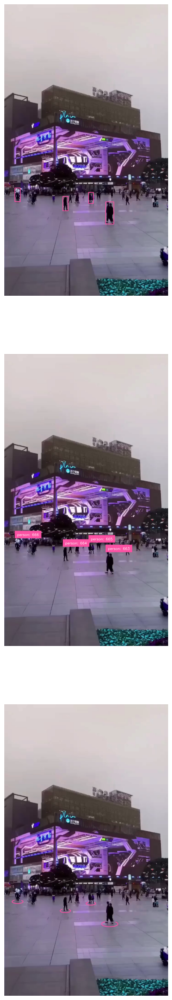

In [162]:
fig, axes = plt.subplots(3, 1, figsize=(30, 30))

for i, annotator in enumerate(annotators):
    if isinstance(annotator, LabelAnnotator):
        annotated_frame = annotator.annotate(
        scene=frame.copy(),
        detections=supervision_detections,
        labels=list(map(lambda x: f"person: {x}", supervision_detections.tracker_id))
        )
    else:
        annotated_frame = annotator.annotate(
        scene=frame.copy(),
        detections=supervision_detections,
        )
    axes[i].axis("off")
    axes[i].imshow(annotated_frame)

fig.show()

Так-же каждый аннотатор принимает параметры, влияющие на конечный результат. Ими можно настраивать текст, цвет, толщину линий и тд.

In [163]:
from supervision import Color, ColorPalette, ColorLookup, Position

In [164]:
bbox_annotator = BoundingBoxAnnotator(ColorPalette.DEFAULT, 4, ColorLookup.TRACK)
label_annotator = LabelAnnotator(ColorPalette.DEFAULT, Color.BLACK, text_position=Position.TOP_CENTER, color_lookup=ColorLookup.TRACK)
ellipse_annotator = EllipseAnnotator(ColorPalette.ROBOFLOW, 4, -30)

annotators = [bbox_annotator, label_annotator, ellipse_annotator]

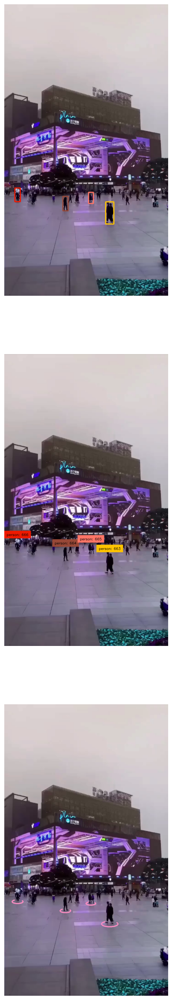

In [165]:
fig, axes = plt.subplots(3, 1, figsize=(30, 30))

for i, annotator in enumerate(annotators):
    if isinstance(annotator, LabelAnnotator):
        annotated_frame = annotator.annotate(
        scene=frame.copy(),
        detections=supervision_detections,
        labels=list(map(lambda x: f"person: {x}", supervision_detections.tracker_id))
        )
    else:
        annotated_frame = annotator.annotate(
        scene=frame.copy(),
        detections=supervision_detections,
        )
    axes[i].axis("off")
    axes[i].imshow(annotated_frame)

fig.show()

## Полный пайплайн

In [166]:
detector = YOLO("yolov8n.pt")
tracker = ByteTrack()
annotator = TraceAnnotator()

In [167]:
gen = get_video_frames_generator(VIDEO_PATH)
video_info = VideoInfo.from_video_path(VIDEO_PATH)

In [168]:
with VideoSink(VIDEO_PATH_NEW, video_info) as sink:
  for frame in gen:
    yolo_detections = detector(frame, verbose=False)[0]
    detections = Detections.from_ultralytics(yolo_detections)
    detections = tracker.update_with_detections(detections)
    annotated_frame = annotator.annotate(
      scene=frame.copy(),
      detections=detections
    )

    sink.write_frame(annotated_frame)

In [169]:
show_video(VIDEO_PATH_NEW)

Тестируем дальше. Добавим свою палитру цветов

In [170]:
detector = YOLO("yolov8s.pt")
tracker = ByteTrack()
my_palette = ColorPalette([Color(r=255, g=0, b=0), Color(r=0, g=255, b=0), Color(r=0, g=0, b=255)]) # можно создавать свои цветовые палитры
annotator = TraceAnnotator(color=my_palette, position=Position.CENTER, trace_length=30, thickness=2, color_lookup=ColorLookup.TRACK)

In [171]:
gen = get_video_frames_generator(VIDEO_PATH)
video_info = VideoInfo.from_video_path(VIDEO_PATH)

In [172]:
with VideoSink(VIDEO_PATH_NEW, video_info) as sink:
    for frame in gen:
        yolo_detections = detector(frame, verbose=False)[0]
        detections = Detections.from_ultralytics(yolo_detections)
        detections = tracker.update_with_detections(detections)
        annotated_frame = annotator.annotate(
        scene=frame.copy(),
        detections=detections
        )

        sink.write_frame(annotated_frame)

In [173]:
show_video(VIDEO_PATH_NEW)

Добавим надписи классов с id к трекингу

In [174]:
detector = YOLO("yolov8s.pt")
tracker = ByteTrack()

label_annotator = LabelAnnotator(ColorPalette.DEFAULT, Color.BLACK, text_position=Position.TOP_CENTER, color_lookup=ColorLookup.TRACK)
trace_annotator = TraceAnnotator(color=ColorPalette.DEFAULT, position=Position.CENTER, trace_length=30, thickness=2, color_lookup=ColorLookup.TRACK)

annotators = [label_annotator, trace_annotator]

In [175]:
gen = get_video_frames_generator(VIDEO_PATH)
video_info = VideoInfo.from_video_path(VIDEO_PATH)

In [176]:
with VideoSink(VIDEO_PATH_NEW, video_info) as sink:
    for frame in gen:
        yolo_detections = detector(frame, verbose=False)[0]
        detections = Detections.from_ultralytics(yolo_detections)
        detections = tracker.update_with_detections(detections)

        # применяем все аннотаторы к каждому кадру
        annotated_frame = frame.copy()
        for annotator in annotators:
            if isinstance(annotator, LabelAnnotator):
                labels = list(map(lambda x: f"person: {x}", detections.tracker_id))
                annotated_frame = annotator.annotate(
                    scene=annotated_frame,
                    detections=detections,
                    labels=labels
                )
            else:
                annotated_frame = annotator.annotate(
                    scene=annotated_frame,
                    detections=detections,
                )

        sink.write_frame(annotated_frame)

In [177]:
show_video(VIDEO_PATH_NEW)